On souhaite classer des images de cellules sanguines en utilisant un CNN. Les images sont groupées en 11 classes :

- **BA :** BAsophiles
- **BNE :** NEutrophiles de Bande
- **EO :** EOsinophiles
- **ERB :** ERythroBlastes
- **LY :** LYmphocytes
- **MMY :** MétaMYélocytes
- **MO :** MOnocytes
- **MY :** MYélocytes
- **PLT :** PLaqueTtes
- **PMY :** Promyélocytes
- **SNE :** NEutrophiles Segmentés

L'approche choisie est le **Transfer Learning** : on utilise le modèle **EfficientNet B0** et les poids optimisés pour ImageNet. Les données utilisées sont celles du dataset **"Barcelone"**.

On va **tester plusieurs structures** pour le bloc de classification. On **jouera également sur la taille des batches**.


# Import des modules. Connexion au Drive.

In [1]:
## 1 - Gives access to the Drive
from google.colab import drive
drive.mount('/content/drive')

## 2 - Modules import
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import cv2

import sys, os
from pathlib import Path
import shutil
import glob
import itertools

import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam

from tensorflow.keras.applications import EfficientNetB0

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, TerminateOnNaN, EarlyStopping

from tensorflow.keras.utils import Sequence
from collections import Counter
from sklearn.utils.class_weight import compute_class_weight

from keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix

sys.path.append('/content/drive/MyDrive/Leukopy')
import leukopy_lib as leuko
from importlib import reload

reload(leuko)

## GPU status verification
tf.test.gpu_device_name()

## GPU type verification
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime > "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

Mounted at /content/drive
Tue Nov  9 16:24:10 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.44       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   38C    P0    32W / 250W |    345MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                              

# Import des données

In [ ]:
## Need to copy all the files on the local computer
!cp -r "/content/drive/MyDrive/Leukopy/data/main_dataset.zip" .
!unzip main_dataset.zip

## Create the original dataframes
path = Path('/content/main_dataset/')

df_train = leuko.generate_images_df(path/'training_set')
df_test = leuko.generate_images_df(path/'testing_set')
df_valid = leuko.generate_images_df(path/'validation_set')

On élimine le label "BL" du dataset : trop peu d'images, trop différentes du reste de Barcelone.

In [3]:
df_train = df_train[df_train["label"] != "BL"]
df_test = df_test[df_test["label"] != "BL"]
df_valid = df_valid[df_valid["label"] != "BL"]

In [4]:
n_classes = df_train["label"].nunique()

On découpe les données en une série de batchs de 32 images. Les images sont redimensionnées (224 * 224 pixels) et on programme une augmentation de données (rotation, symétries axiales). Le preprocessing spécifique à ce modèle est géré par une couche du modèle lui-même. Il n'y a donc pas de fonction preprocess_input à intégrer dans ImageDataGenerator.

In [5]:
batch_size = 32
img_height  = 224
img_width = 224

# Augmentation seulement sur le jeu d'entraînement. On ne normalise pas, EfficientNet le fait lui-même.
train_generator = ImageDataGenerator(rotation_range = 90,
                                     horizontal_flip = True, 
                                     vertical_flip = True)
valid_generator = ImageDataGenerator()
test_generator = ImageDataGenerator()

# Batchs, redimensionnement, chargement des images
training_set = train_generator.flow_from_dataframe(df_train, 
                                                   directory = None, # utilise x_col
                                                   x_col = 'img_path', 
                                                   y_col = 'label',
                                                   target_size = (img_height, img_width), 
                                                   color_mode = 'rgb',
                                                   classes = None,   # utilise y_col
                                                   class_mode = 'categorical', 
                                                   batch_size = batch_size, 
                                                   shuffle = True)

validation_set = valid_generator.flow_from_dataframe(df_valid, 
                                                     directory = None, # utilise x_col
                                                     x_col = 'img_path', 
                                                     y_col = 'label',
                                                     target_size = (img_height, img_width), 
                                                     color_mode = 'rgb',
                                                     classes = None,   # utilise y_col
                                                     class_mode = 'categorical', 
                                                     batch_size = batch_size, 
                                                     shuffle = True)

testing_set = test_generator.flow_from_dataframe(df_test, 
                                                 directory = None, # utilise x_col
                                                 x_col = 'img_path', 
                                                 y_col = 'label',
                                                 target_size = (img_height, img_width),
                                                 color_mode = 'rgb',
                                                 classes = None,   # utilise y_col
                                                 class_mode = 'categorical', 
                                                 batch_size = batch_size, 
                                                 shuffle = False)

# Labels/Index connection :
label_map = training_set.class_indices
print('Train :', training_set.class_indices)
print('Valid :', validation_set.class_indices)
print('Test  :', testing_set.class_indices)

Found 12677 validated image filenames belonging to 11 classes.
Found 1730 validated image filenames belonging to 11 classes.
Found 2544 validated image filenames belonging to 11 classes.
Train : {'BA': 0, 'BNE': 1, 'EO': 2, 'ERB': 3, 'LY': 4, 'MMY': 5, 'MO': 6, 'MY': 7, 'PLT': 8, 'PMY': 9, 'SNE': 10}
Valid : {'BA': 0, 'BNE': 1, 'EO': 2, 'ERB': 3, 'LY': 4, 'MMY': 5, 'MO': 6, 'MY': 7, 'PLT': 8, 'PMY': 9, 'SNE': 10}
Test  : {'BA': 0, 'BNE': 1, 'EO': 2, 'ERB': 3, 'LY': 4, 'MMY': 5, 'MO': 6, 'MY': 7, 'PLT': 8, 'PMY': 9, 'SNE': 10}


# Modèle B0 - Structure n°1

## Modèle

On crée une fonction calculant des poids, permettant de pénaliser l'erreur commise sur les classes les moins représentées du dataset. On espère ainsi compenser partiellement le déséquilibre du dataset.

In [6]:
def compute_weights(training_set):
  counter = Counter(training_set.classes)                       
  class_weights = {class_id : (1/num_images)*float(sum(counter.values()))/2 for class_id, num_images in counter.items()}
  return class_weights

**On connecte le modèle EfficientNet (modèle gelé) à un ensemble de 3 couches Denses (1280, 640, 11).** La couche Dense de sortie est activée par la fonction Softmax pour calculer des probabilités d'appartenance aux classes.

On utilise Adam pour gérer la descente de gradient et on démarre avec un taux d'apprentissage égal à 10e-3.

In [ ]:
################################################### MODEL - 11 classes ###################################################

# Model (Functional API)
inputs = layers.Input(shape = (img_height,img_width,3))
base_model = EfficientNetB0(include_top = False,
                            weights = 'imagenet',
                            input_tensor = inputs,
                            input_shape = (img_height,img_width,3),
                            pooling = 'avg')

base_model.training = False     # Freeze EfficientNetB0 layers
base_output = base_model.output # Cette écriture permet d'avoir les couches de "base_model" au même niveau que les couches suivantes (voir model.summary())=> Grad-CAM peut fonctionner

x = layers.Dense(units = 1280, activation = 'relu', name = 'dense_1')(base_output)
x = layers.Dense(units = 640, activation = 'relu', name = 'dense_2')(x)
outputs = layers.Dense(units = n_classes, activation = 'softmax', name = 'final_softmax')(x)
model = tf.keras.Model(inputs, outputs)

base_model.trainable = False

# Compile
optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-3)
model.compile(optimizer = optimizer, 
              loss = "categorical_crossentropy",
              metrics = ["accuracy"])

16719872/16705208 [==============================] - 0s 0us/step


In [ ]:
# Structure du modèle
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
rescaling (Rescaling)           (None, 224, 224, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
normalization (Normalization)   (None, 224, 224, 3)  7           rescaling[0][0]                  
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (None, 225, 225, 3)  0           normalization[0][0]              
______________________________________________________________________________________________

## Entraînement

In [ ]:
## Compute weights :
class_weights = compute_weights(training_set)

## Callbacks :
TON = TerminateOnNaN()

control_lr = ReduceLROnPlateau(monitor = 'val_loss', factor = 0.1, patience = 3, verbose = 1, mode = 'min', min_lr = 1e-6)
  
early_stopping = EarlyStopping(monitor = "val_loss", patience = 4, mode = 'min', restore_best_weights = True)

callbacks_list = [TON, control_lr, early_stopping]

## Training :
epochs = 100
training_history = model.fit(x = training_set, 
                             epochs = epochs,
                             callbacks = callbacks_list,
                             validation_data = validation_set, 
                             class_weight = class_weights)

Epoch 1/100
397/397 [==============================] - 171s 381ms/step - loss: 5.3589 - accuracy: 0.6654 - val_loss: 0.6368 - val_accuracy: 0.7624
Epoch 2/100
397/397 [==============================] - 150s 378ms/step - loss: 3.6714 - accuracy: 0.7728 - val_loss: 0.5311 - val_accuracy: 0.7994
Epoch 3/100
397/397 [==============================] - 150s 379ms/step - loss: 3.3748 - accuracy: 0.7902 - val_loss: 0.5085 - val_accuracy: 0.8029
Epoch 4/100
397/397 [==============================] - 150s 377ms/step - loss: 3.1434 - accuracy: 0.8111 - val_loss: 0.4922 - val_accuracy: 0.8243
Epoch 5/100
397/397 [==============================] - 150s 379ms/step - loss: 2.9509 - accuracy: 0.8235 - val_loss: 0.4367 - val_accuracy: 0.8289
Epoch 6/100
397/397 [==============================] - 150s 378ms/step - loss: 2.8524 - accuracy: 0.8313 - val_loss: 0.4365 - val_accuracy: 0.8364
Epoch 7/100
397/397 [==============================] - 151s 379ms/step - loss: 2.7822 - accuracy: 0.8342 - val_loss: 0

In [ ]:
model.save("/content/drive/MyDrive/Leukopy/models/efficientnet_b0")

INFO:tensorflow:Assets written to: /content/drive/MyDrive/Leukopy/models/efficientnet_b0/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


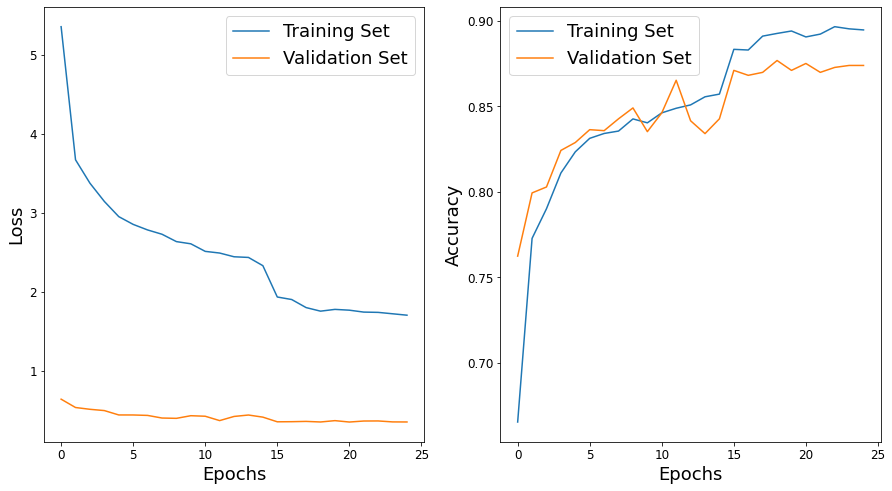

In [ ]:
fig = plt.figure(figsize = (15,8))

fig.add_subplot(1,2,1)
plt.plot(training_history.history["loss"], label = 'Training Set')
plt.plot(training_history.history["val_loss"], label = 'Validation Set')
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.xlabel('Epochs', fontsize = 18)
plt.ylabel('Loss', fontsize = 18)
plt.legend(fontsize = 18)

fig.add_subplot(1,2,2)
plt.plot(training_history.history["accuracy"], label = 'Training Set')
plt.plot(training_history.history["val_accuracy"], label = 'Validation Set')
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.xlabel('Epochs', fontsize = 18)
plt.ylabel('Accuracy', fontsize = 18)
plt.legend(fontsize = 18)

On obtient une **accuracy voisine de 87~88%** sur le jeu de validation, contre pratiquement 90% pour le jeu d'entraînement. S'il y a peut-être un léger surapprentissage (à partir de la 15e epoch, lorsqu'on a réduit le learning rate à 1e-4, celui-ci reste faible.

## Évaluation

Import des poids du modèle :

In [ ]:
model = tf.keras.models.load_model("/content/drive/MyDrive/Leukopy/models/efficientnet_b0")

### Fonctions

In [8]:
def print_classification_report(testing_set, labels, title):
  """
  Rapport de classification + Matrice de confusion
  """
  # Prédiction : utilise le jeu de test (testing_set)
  predictions = model.predict(testing_set)
  y_pred = tf.argmax(predictions, axis = 1)

  # Calcul et affichage de la matrice de confusion
  cnf_matrix = confusion_matrix(testing_set.classes, y_pred, normalize = 'true')
  classes = range(len(labels))
  
  plt.figure(figsize = (12,12))
  plt.imshow(cnf_matrix, interpolation = 'nearest', cmap = 'Blues')
  plt.title("Matrice de confusion - "+title)
  plt.colorbar()

  tick_marks = np.arange(len(labels))
  plt.xticks(tick_marks, labels)
  plt.yticks(tick_marks, labels)

  for i, j in itertools.product(range(cnf_matrix.shape[0]), 
                                range(cnf_matrix.shape[1])):
    plt.text(j, i, np.around(cnf_matrix[i, j], decimals = 3),
             horizontalalignment = "center",
             color = "white" if cnf_matrix[i, j] > ( cnf_matrix.max() / 2) else "black")

  plt.ylabel('Vrais labels')
  plt.xlabel('Labels prédits')
  plt.show()

  # Rapport de classification 
  report = classification_report(testing_set.classes, y_pred, target_names = labels, output_dict = True)

  df_report = pd.DataFrame(index = list(report.keys())[:-3], columns = list(report["BA"].keys()))
  for key in list(report.keys())[:-3]:
    for column in list(report["BA"].keys()):
      df_report.loc[key, column] = report[key][column]
  
  print("Classification Report - "+title)
  return y_pred, display(df_report)

Fonctions pour Grad-CAM :

*Rappelons que le modèle EfficientNet se charge lui-même d'appliquer le preprocessing spécifique.*

In [9]:
def get_img_array(img_path, size = (img_height, img_width)):
  """
  Importe une image et applique le preprocessing nécessaire à l'utilisation de Xception : batch + preprocess_input
  """
  img_array = tf.keras.preprocessing.image.load_img(img_path, target_size = size)
  img_array = tf.keras.preprocessing.image.img_to_array(img_array)
  img_array = np.expand_dims(img_array, axis = 0)
  return img_array

def make_heatmap(img_array, model, last_conv_layer, class_index):
  """
  Calcule la CAM (Class Activation Map) correspondant au label d'indice "class_index" pour l'image "img_array"
  model : un modèle déjà entraîné, dont on désactive la fonction d'activation en sortie (fait dans grandcam())
  last_conv_layer : dernière couche de convolution du modèle. Trouvée automatiquement par la fonction gradcam()
  class_index : renseigné dans l'appel de gradcam() ou trouvé automatiquement par gradcam()
  """
  grad_model = tf.keras.models.Model([model.inputs], [last_conv_layer.output, model.output])
  
  with tf.GradientTape() as tape:
    last_conv_layer_output, preds = grad_model(img_array)
    class_channel = preds[:, class_index]

  grads = tape.gradient(class_channel, last_conv_layer_output)
  pooled_grads = tf.reduce_mean(grads, axis = (0, 1, 2))

  heatmap_tmp = last_conv_layer_output[0].numpy()

  # Multiplie chaque carte d'activation par le gradient, puis moyenne
  for i in range(last_conv_layer_output.shape[3]):
    heatmap_tmp[:,:,i] *= pooled_grads[i]
  heatmap = np.mean(heatmap_tmp, axis=-1)
  return heatmap


def gradcam(model, img_path, img_height, img_width, class_index = None, alpha = 0.5, plot = True):

  # Désactive softmax sur la dernière couche :
  model.layers[-1].activation = None

  # Détecte la dernière couche de convolution du modèle :
  for layer in reversed(model.layers):
    if 'conv' in layer.name:
      last_conv_layer = model.get_layer(layer.name)
      break

  img_array = get_img_array(img_path, size = (img_height, img_width))

  # Chargement + preprocessing de l'image (conversion, batch, vgg19 special preprocessing):
  if class_index == None :
    # Trouve la classe la plus probable :
    predict = model.predict(img_array)
    class_index = np.argmax(predict[0])

  # Calcul de la CAM : resize pour superposition avec l'image finale
  heatmap = make_heatmap(img_array, model, last_conv_layer, class_index)
  big_heatmap = heatmap

  # Réactive softmax :
  model.layers[-1].activation = tf.keras.activations.softmax

  ## Traitement de la Heatmap
  # Applique ReLu (élimine les valeurs négatives de la heatmap)
  big_heatmap = np.maximum(0, big_heatmap)
  # Normalisation
  big_heatmap = big_heatmap/big_heatmap.max()

  ## Superposition de l'image et de la heatmap 
  # 1/ Import de l'image d'origine
  img = tf.keras.preprocessing.image.load_img(img_path)
  img = tf.keras.preprocessing.image.img_to_array(img)

  # 2/ Rescale heatmap: 0-255
  big_heatmap = np.uint8(255*big_heatmap)
  # 3/ Jet colormap
  jet = cm.get_cmap("jet")
  # 4/ Use RGB values of the colormap
  jet_colors = jet(np.arange(256))[:, :3]
  jet_heatmap = jet_colors[big_heatmap]
  # 5/ Create an image with RGB colorized heatmap
  jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)
  jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
  jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)
  # 6/ Superimpose the heatmap on original image
  superimposed_img = jet_heatmap*alpha + img
  superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)

  if plot == True:
    # 7/ Affichage des résultats
    fig = plt.figure(figsize = (8,8))
    fig.add_subplot(1,2,1)
    plt.imshow(big_heatmap)

    fig.add_subplot(1,2,2)
    plt.imshow(superimposed_img)
    plt.title("Chosen class : "+str(list(label_map.keys())[class_index]))

  return big_heatmap, superimposed_img

### Performances : métriques

In [10]:
model.evaluate(testing_set)

80/80 [==============================] - 24s 95ms/step - loss: 0.3270 - accuracy: 0.8719


[0.3270436227321625, 0.8718553185462952]

L'accuracy globale mesurée sur le jeu de validation est confirmée sur le jeu de test : on obtient **87%**.

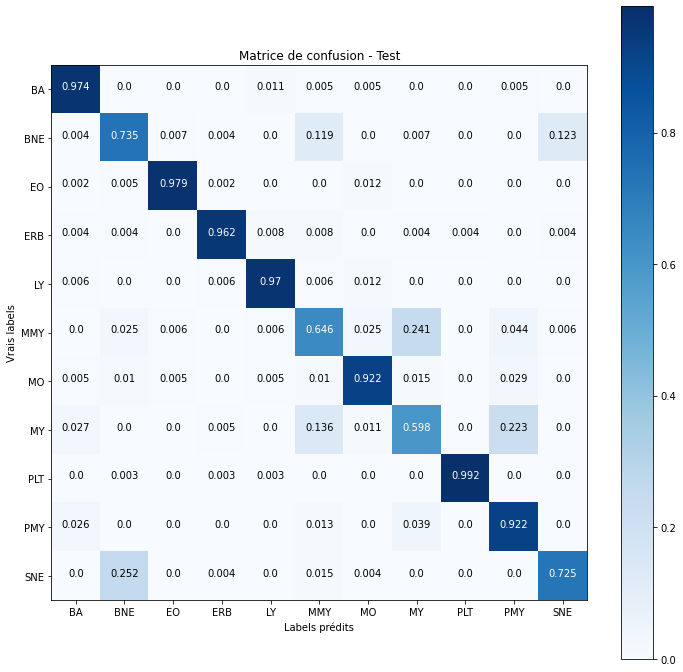

Classification Report - Test


,precision,recall,f1-score,support
BA,0.938776,0.973545,0.955844,189
BNE,0.721612,0.735075,0.728281,268
EO,0.990632,0.979167,0.984866,432
ERB,0.974359,0.962025,0.968153,237
LY,0.958824,0.970238,0.964497,168
MMY,0.6,0.64557,0.621951,158
MO,0.926829,0.92233,0.924574,206
MY,0.700637,0.597826,0.645161,184
PLT,0.99723,0.991736,0.994475,363
PMY,0.563492,0.922078,0.699507,77


In [11]:
y_pred, df_report = print_classification_report(testing_set, label_map, title = "Test")

PLT, EO, ERB, LY, BA et dans une moindre mesure MO sont très bien modélisées. 

**La lignée des neutrophiles, comme de coutume, lui pose des difficultés :** les SNE sont confondus avec les BNE. Les BNE sont parfois classés comme SNE (stade suivant) ou comme MMY (stade précédent) et ainsi de suite jusqu'aux PMY, les cellules les plus immatures de la lignée. 

In [12]:
df_results = pd.DataFrame(data = {"label":testing_set.classes,
                                  "label_pred":y_pred, 
                                  "img_path":df_test["img_path"]})

df_results["well_classified"] = np.where(df_results["label"] == df_results["label_pred"], True, False)

### Performances - Grad-CAM :

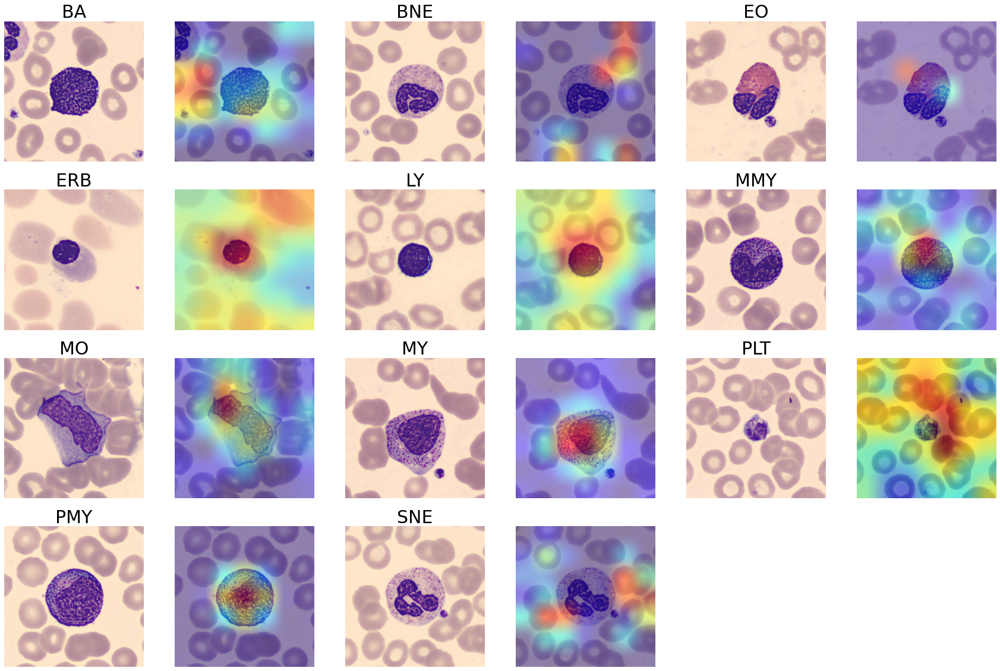

In [14]:
fig = plt.figure(figsize = (30, 20))
i = 0

for cell_class in range(n_classes):
  df_temp = df_results[(df_results["label"] == cell_class) & (df_results["well_classified"] == True)]
  id = np.random.choice(df_temp.index, size = 1, replace = False)
  img_path = df_temp.loc[id[0],"img_path"]
 
  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, 
                                          class_index = None, alpha = 0.8, plot = False)

  fig.add_subplot(4,6,i+1)
  plt.imshow(plt.imread(img_path))
  plt.title(list(label_map.keys())[cell_class], fontsize = 30)
  plt.grid(None)
  plt.axis('off')

  fig.add_subplot(4,6,i+2)
  plt.imshow(superimposed_img)
  plt.grid(None)
  plt.axis('off')

  i += 2

plt.savefig("/content/drive/MyDrive/Leukopy/models/efficientnet_b0/enetb0_gc")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:65: RuntimeWarning: invalid value encountered in true_divide


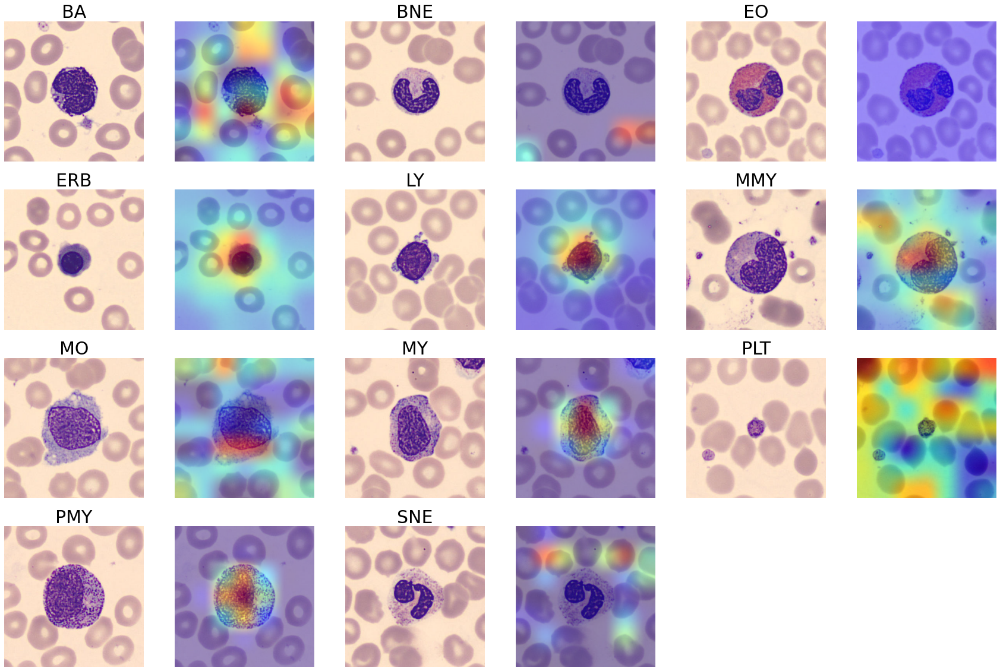

In [16]:
fig = plt.figure(figsize = (30, 20))
i = 0

for cell_class in range(n_classes):
  df_temp = df_results[(df_results["label"] == cell_class) & (df_results["well_classified"] == True)]
  id = np.random.choice(df_temp.index, size = 1, replace = False)
  img_path = df_temp.loc[id[0],"img_path"]
 
  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, 
                                          class_index = None, alpha = 0.8, plot = False)

  fig.add_subplot(4,6,i+1)
  plt.imshow(plt.imread(img_path))
  plt.title(list(label_map.keys())[cell_class], fontsize = 30)
  plt.grid(None)
  plt.axis('off')

  fig.add_subplot(4,6,i+2)
  plt.imshow(superimposed_img)
  plt.grid(None)
  plt.axis('off')

  i += 2

plt.savefig("/content/drive/MyDrive/Leukopy/models/efficientnet_b0/enetb0_gc2")

**Grad-CAM produit des résultats globalement assez mauvais :** le modèle s'intéresse parfois davantage à plusieurs globules rouges qu'à la cellule d'intérêt située au centre de l'image. Il est assez difficile d'interpréter les résultats.

# Modèle B0 - Structure n°2

## Modèle

Nous allons **insérer des couches de Dropout** entre les couches Denses du modèle précédent.

In [17]:
# Model (Functional API)
inputs = layers.Input(shape = (img_height,img_width,3))
base_model = EfficientNetB0(include_top = False,
                            weights = 'imagenet',
                            input_tensor = inputs,
                            input_shape = (img_height,img_width,3),
                            pooling = 'avg')

base_model.training = False     # Freeze EfficientNetB0 layers
base_output = base_model.output # Cette écriture permet d'avoir les couches de "base_model" au même niveau que les couches suivantes (voir model.summary())=> Grad-CAM peut fonctionner

x = layers.Dense(units = 1280, activation = 'relu', name = 'dense_1')(base_output)
x = layers.Dropout(rate = 0.2, name = 'dropout_1')(x)
x = layers.Dense(units = 640, activation = 'relu', name = 'dense_2')(x)
x = layers.Dropout(rate = 0.2, name = 'dropout_2')(x)
outputs = layers.Dense(units = n_classes, activation = 'softmax', name = 'final_softmax')(x)
model = tf.keras.Model(inputs, outputs)

base_model.trainable = False

# Compile
optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-3)
model.compile(optimizer = optimizer, 
              loss = "categorical_crossentropy",
              metrics = ["accuracy"])

16719872/16705208 [==============================] - 0s 0us/step


In [19]:
## Compute weights :
class_weights = compute_weights(training_set)

## Callbacks :
TON = TerminateOnNaN()

control_lr = ReduceLROnPlateau(monitor = 'val_loss', factor = 0.1, patience = 3, verbose = 1, mode = 'min', min_lr = 1e-6)
  
early_stopping = EarlyStopping(monitor = "val_loss", patience = 4, mode = 'min', restore_best_weights = True)

callbacks_list = [TON, control_lr, early_stopping]

## Training :
epochs = 100
training_history = model.fit(x = training_set, 
                             epochs = epochs,
                             callbacks = callbacks_list,
                             validation_data = validation_set, 
                             class_weight = class_weights)

Epoch 1/100
397/397 [==============================] - 156s 378ms/step - loss: 5.7615 - accuracy: 0.6434 - val_loss: 0.6921 - val_accuracy: 0.7474
Epoch 2/100
397/397 [==============================] - 149s 375ms/step - loss: 4.0586 - accuracy: 0.7513 - val_loss: 0.6358 - val_accuracy: 0.7584
Epoch 3/100
397/397 [==============================] - 148s 373ms/step - loss: 3.6995 - accuracy: 0.7720 - val_loss: 0.4816 - val_accuracy: 0.8179
Epoch 4/100
397/397 [==============================] - 149s 374ms/step - loss: 3.4399 - accuracy: 0.7905 - val_loss: 0.5378 - val_accuracy: 0.7977
Epoch 5/100
397/397 [==============================] - 149s 375ms/step - loss: 3.3755 - accuracy: 0.7978 - val_loss: 0.4790 - val_accuracy: 0.8150
Epoch 6/100
397/397 [==============================] - 148s 373ms/step - loss: 3.2499 - accuracy: 0.8098 - val_loss: 0.4722 - val_accuracy: 0.8133
Epoch 7/100
397/397 [==============================] - 148s 374ms/step - loss: 3.1079 - accuracy: 0.8092 - val_loss: 0

In [20]:
## Sauvegarde avant FT
model.save("/content/drive/MyDrive/Leukopy/models/b0_structure2")

INFO:tensorflow:Assets written to: /content/drive/MyDrive/Leukopy/models/b0_structure2/assets


INFO:tensorflow:Assets written to: /content/drive/MyDrive/Leukopy/models/b0_structure2/assets
/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


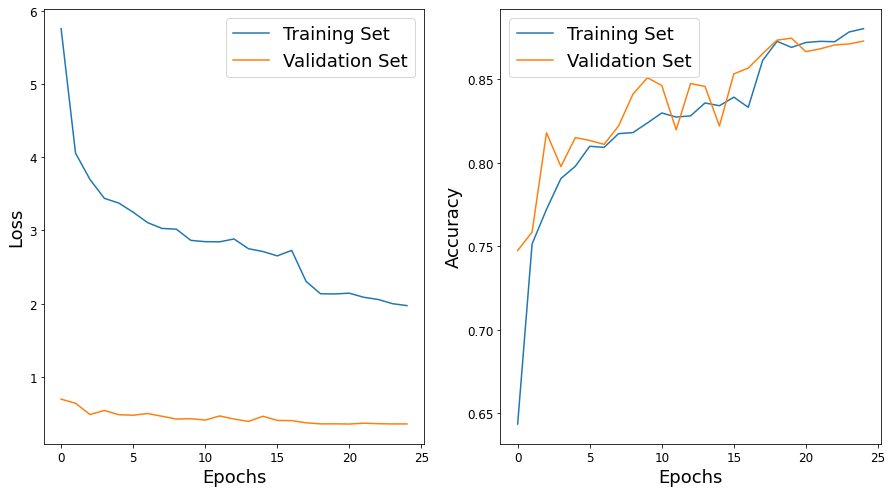

In [21]:
# Final Version
fig = plt.figure(figsize = (15,8))

fig.add_subplot(1,2,1)
plt.plot(training_history.history["loss"], label = 'Training Set')
plt.plot(training_history.history["val_loss"], label = 'Validation Set')
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.xlabel('Epochs', fontsize = 18)
plt.ylabel('Loss', fontsize = 18)
plt.legend(fontsize = 18)

fig.add_subplot(1,2,2)
plt.plot(training_history.history["accuracy"], label = 'Training Set')
plt.plot(training_history.history["val_accuracy"], label = 'Validation Set')
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.xlabel('Epochs', fontsize = 18)
plt.ylabel('Accuracy', fontsize = 18)
plt.legend(fontsize = 18)

## Évaluation

Évaluation sur les données de test :

In [22]:
model.evaluate(testing_set)

80/80 [==============================] - 8s 96ms/step - loss: 0.3347 - accuracy: 0.8660


[0.3347299098968506, 0.865959107875824]

Rapport de classification et matrice de confusion :

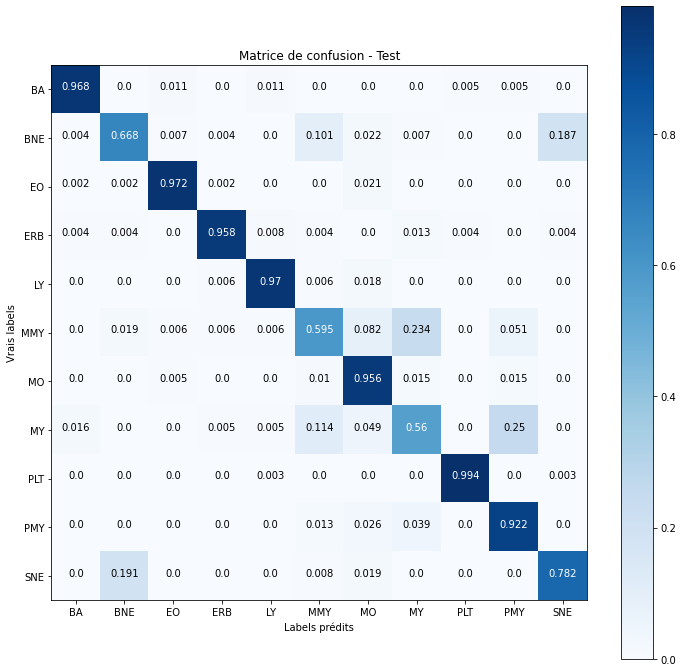

Classification Report - Test


,precision,recall,f1-score,support
BA,0.968254,0.968254,0.968254,189
BNE,0.764957,0.66791,0.713147,268
EO,0.985915,0.972222,0.979021,432
ERB,0.978448,0.957806,0.968017,237
LY,0.958824,0.970238,0.964497,168
MMY,0.630872,0.594937,0.612378,158
MO,0.807377,0.956311,0.875556,206
MY,0.682119,0.559783,0.614925,184
PLT,0.99449,0.99449,0.99449,363
PMY,0.550388,0.922078,0.68932,77


In [23]:
y_pred, df_report = print_classification_report(testing_set, label_map, title = "Test")

In [24]:
df_results = pd.DataFrame(data = {"label":testing_set.classes,
                                  "label_pred":y_pred, 
                                  "img_path":df_test["img_path"]})

df_results["well_classified"] = np.where(df_results["label"] == df_results["label_pred"], True, False)

## Grad-CAM :

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:65: RuntimeWarning: invalid value encountered in true_divide


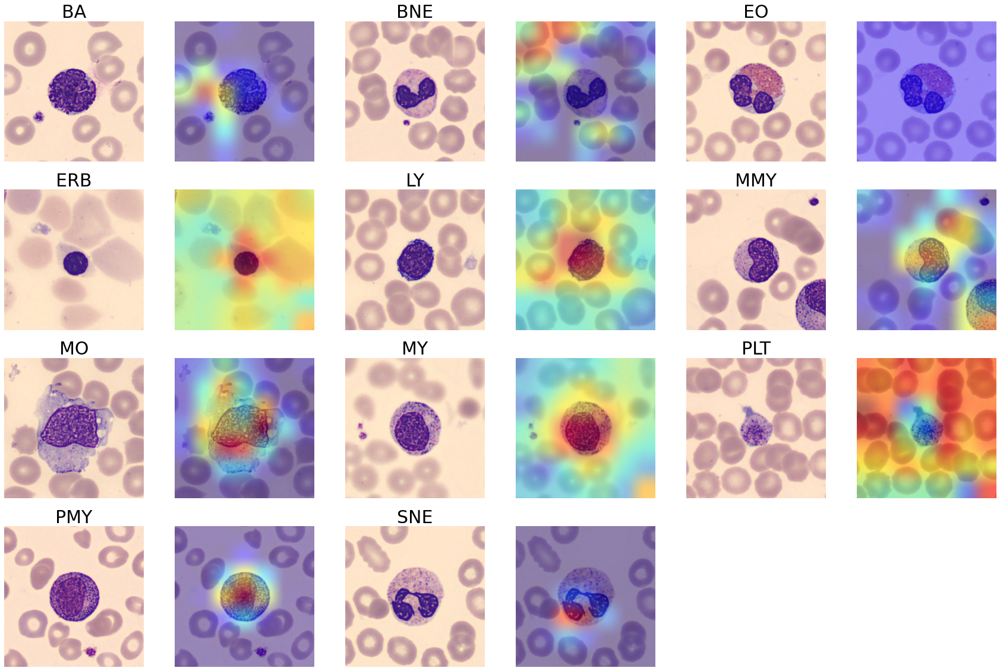

In [25]:
fig = plt.figure(figsize = (30, 20))
i = 0

for cell_class in range(n_classes):
  df_temp = df_results[(df_results["label"] == cell_class) & (df_results["well_classified"] == True)]
  id = np.random.choice(df_temp.index, size = 1, replace = False)
  img_path = df_temp.loc[id[0],"img_path"]
 
  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, 
                                          class_index = None, alpha = 0.8, plot = False)

  fig.add_subplot(4,6,i+1)
  plt.imshow(plt.imread(img_path))
  plt.title(list(label_map.keys())[cell_class], fontsize = 30)
  plt.grid(None)
  plt.axis('off')

  fig.add_subplot(4,6,i+2)
  plt.imshow(superimposed_img)
  plt.grid(None)
  plt.axis('off')

  i += 2

plt.savefig("/content/drive/MyDrive/Leukopy/models/b0_structure2/b0_s2_gcam")

# Modèle B0 - Structure n°3 :

## Modèle

On ajoute une couche Dense supplémentaire au modèle.

In [ ]:
# Model (Functional API)

inputs = layers.Input(shape = (img_height,img_width,3))
base_model = EfficientNetB0(include_top = False,
                            weights = 'imagenet',
                            input_tensor = inputs,
                            input_shape = (img_height,img_width,3),
                            pooling = 'avg')

base_model.training = False
base_output = base_model.output

x = layers.Dense(units = 2048, activation = 'relu', name = 'dense_1')(base_output)
x = layers.Dense(units = 1024, activation = 'relu', name = 'dense_2')(x)
x = layers.Dense(units = 512, activation = 'relu', name = 'dense_3')(x)
outputs = layers.Dense(units = n_classes, activation = 'softmax', name = 'final_softmax')(x)
model = tf.keras.Model(inputs, outputs)

base_model.trainable = False

# Compile
optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-3)
model.compile(optimizer = optimizer, 
              loss = "categorical_crossentropy",
              metrics = ["accuracy"])

## Entraînement

In [ ]:
## Compute weights :
class_weights = compute_weights(training_set)

## Callbacks :
TON = TerminateOnNaN()

control_lr = ReduceLROnPlateau(monitor = 'val_loss', factor = 0.1, patience = 3, verbose = 1, mode = 'min', min_lr = 1e-6)
  
early_stopping = EarlyStopping(monitor = "val_loss", patience = 4, mode = 'min', restore_best_weights = True)

callbacks_list = [TON, control_lr, early_stopping]

## Training :
epochs = 100
training_history = model.fit(x = training_set, 
                             epochs = epochs,
                             callbacks = callbacks_list,
                             validation_data = validation_set, 
                             class_weight = class_weights)

Epoch 1/100
397/397 [==============================] - 156s 382ms/step - loss: 5.5802 - accuracy: 0.6494 - val_loss: 0.9840 - val_accuracy: 0.6191
Epoch 2/100
397/397 [==============================] - 149s 376ms/step - loss: 3.9693 - accuracy: 0.7566 - val_loss: 0.7200 - val_accuracy: 0.7462
Epoch 3/100
397/397 [==============================] - 149s 375ms/step - loss: 3.5415 - accuracy: 0.7855 - val_loss: 0.4847 - val_accuracy: 0.8133
Epoch 4/100
397/397 [==============================] - 149s 376ms/step - loss: 3.3964 - accuracy: 0.7921 - val_loss: 0.5208 - val_accuracy: 0.8069
Epoch 5/100
397/397 [==============================] - 149s 375ms/step - loss: 3.1098 - accuracy: 0.8127 - val_loss: 0.4553 - val_accuracy: 0.8347
Epoch 6/100
397/397 [==============================] - 148s 374ms/step - loss: 2.9413 - accuracy: 0.8242 - val_loss: 0.4469 - val_accuracy: 0.8324
Epoch 7/100
397/397 [==============================] - 148s 373ms/step - loss: 2.8841 - accuracy: 0.8281 - val_loss: 0

L'accuracy globale obtenue avec cette structure est **globalement identique à celle mesurée avec la structure n°1**.

In [ ]:
## Sauvegarde avant FT
model.save("/content/drive/MyDrive/Leukopy/EffNetB0_Final/structure_3")

INFO:tensorflow:Assets written to: /content/drive/MyDrive/Leukopy/EffNetB0_Final/structure_3/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


## Évaluation

**Import des poids du modèle :**

In [ ]:
model = tf.keras.models.load_model("/content/drive/MyDrive/Leukopy/EffNetB0_Final/structure_3")

**Accuracy globale sur le jeu de test :**

In [ ]:
model.evaluate(testing_set)

80/80 [==============================] - 8s 95ms/step - loss: 0.3414 - accuracy: 0.8664


[0.34138646721839905, 0.8663522005081177]

**Rapport de classification et matrice de confusion :**

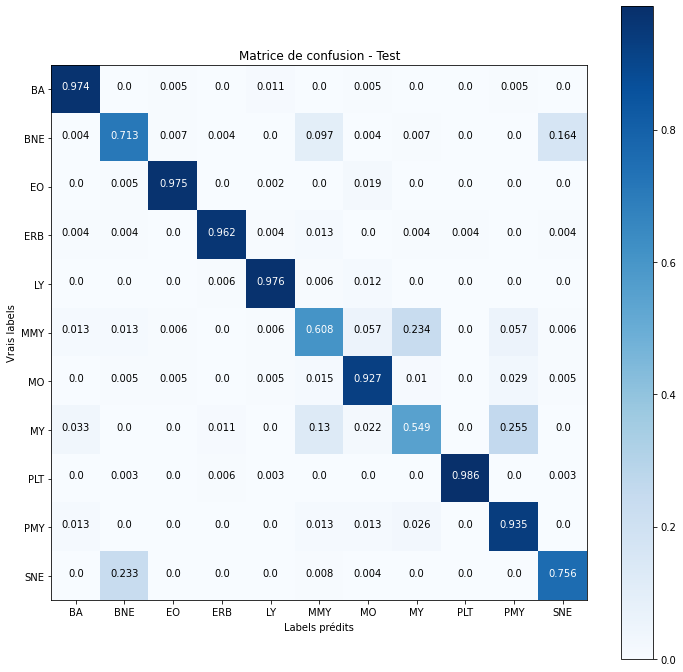

Classification Report - Test


,precision,recall,f1-score,support
BA,0.94359,0.973545,0.958333,189
BNE,0.737452,0.712687,0.724858,268
EO,0.988263,0.974537,0.981352,432
ERB,0.974359,0.962025,0.968153,237
LY,0.959064,0.97619,0.967552,168
MMY,0.615385,0.607595,0.611465,158
MO,0.876147,0.927184,0.900943,206
MY,0.696552,0.548913,0.613982,184
PLT,0.997214,0.986226,0.99169,363
PMY,0.533333,0.935065,0.679245,77


In [ ]:
y_pred, df_report = print_classification_report(testing_set, label_map, title = "Test")

In [ ]:
df_results = pd.DataFrame(data = {"label":testing_set.classes,
                                  "label_pred":y_pred, 
                                  "img_path":df_test["img_path"]})

df_results["well_classified"] = np.where(df_results["label"] == df_results["label_pred"], True, False)

## Grad-CAM :

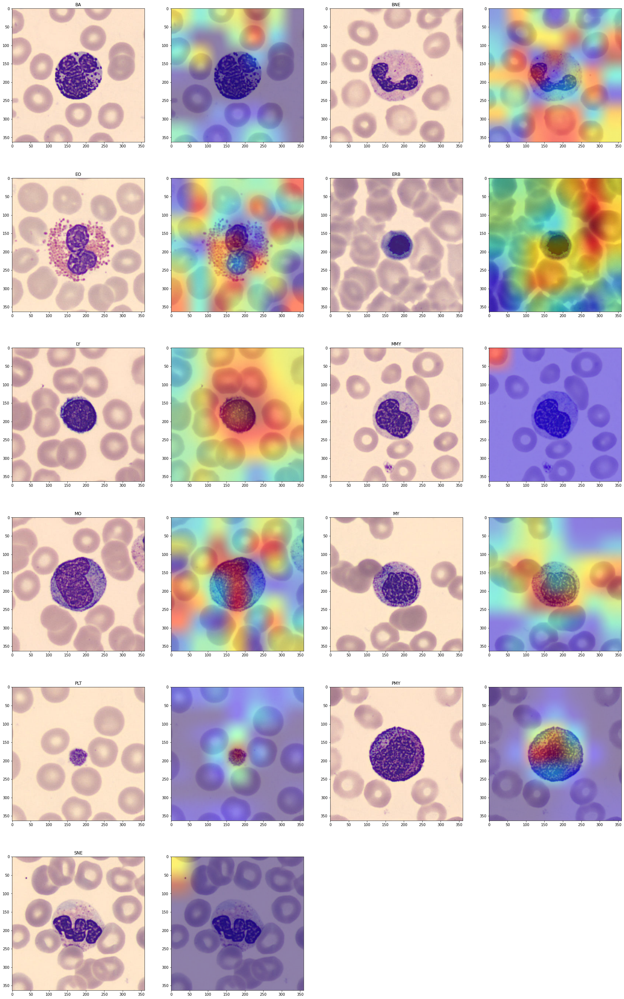

In [ ]:
fig = plt.figure(figsize = (30, 20))
i = 0

for cell_class in range(n_classes):
  df_temp = df_results[(df_results["label"] == cell_class) & (df_results["well_classified"] == True)]
  id = np.random.choice(df_temp.index, size = 1, replace = False)
  img_path = df_temp.loc[id[0],"img_path"]
 
  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, 
                                          class_index = None, alpha = 0.8, plot = False)

  fig.add_subplot(4,6,i+1)
  plt.imshow(plt.imread(img_path))
  plt.title(list(label_map.keys())[cell_class], fontsize = 30)
  plt.grid(None)
  plt.axis('off')

  fig.add_subplot(4,6,i+2)
  plt.imshow(superimposed_img)
  plt.grid(None)
  plt.axis('off')

  i += 2

plt.savefig("/content/drive/MyDrive/Leukopy/EffNetB0_Final/B0_structure3_gradcam")

**Les cartes thermiques sont mauvaises** : on ne peut pas en rester là. Le modèle cible rarement la cellule seule et souvent des éléments qui n'ont aucune importance pour ce problème, comme des globules rouges ou des paquets de globules rouges.

# Conclusion générale sur EfficientNet B0

D'autres structures pour le bloc de classification ont été testées (nombre de couches & nombre de neurones) et conduisent à des résultats du même ordre en termes d'accuracy globale (comparable à LeNet) et de Grad-CAM (globalement mauvais).

Pour aller plus loin, nous allons essayer la **version B3 d'EfficientNet**.

# Bonus : effet de la taille des batches

Dans la mesure où la descente de gradient s'effectue batch après batch et non sur la totalité des images, la taille et la composition des batches peuvent avoir un effet sur l'entraînement du modèle et donc sur sa performance. Un compromis doit être trouvé entre la mémoire vive requise pour stocker les données (limite haute de la batch_size) et la qualité de l'approximation de la fonction de coût (limite basse de la batch_size).

 Nous avons essayé la structure 1 avec deux tailles de batches supplémentaires : 16 et 64.

## batch_size = 16

### Data

In [ ]:
batch_size = 16
img_height  = 224
img_width = 224

# Augmentation seulement sur le jeu d'entraînement. On ne normalise pas, EfficientNet le fait lui-même.
train_generator = ImageDataGenerator(rotation_range = 90,
                                     horizontal_flip = True, 
                                     vertical_flip = True)
valid_generator = ImageDataGenerator()
test_generator = ImageDataGenerator()

# Batchs, redimensionnement, chargement des images
training_set = train_generator.flow_from_dataframe(df_train, 
                                                   directory = None, # utilise x_col
                                                   x_col = 'img_path', 
                                                   y_col = 'label',
                                                   target_size = (img_height, img_width), 
                                                   color_mode = 'rgb',
                                                   classes = None,   # utilise y_col
                                                   class_mode = 'categorical', 
                                                   batch_size = batch_size, 
                                                   shuffle = True)

validation_set = valid_generator.flow_from_dataframe(df_valid, 
                                                     directory = None, # utilise x_col
                                                     x_col = 'img_path', 
                                                     y_col = 'label',
                                                     target_size = (img_height, img_width), 
                                                     color_mode = 'rgb',
                                                     classes = None,   # utilise y_col
                                                     class_mode = 'categorical', 
                                                     batch_size = batch_size, 
                                                     shuffle = True)

testing_set = test_generator.flow_from_dataframe(df_test, 
                                                 directory = None, # utilise x_col
                                                 x_col = 'img_path', 
                                                 y_col = 'label',
                                                 target_size = (img_height, img_width),
                                                 color_mode = 'rgb',
                                                 classes = None,   # utilise y_col
                                                 class_mode = 'categorical', 
                                                 batch_size = batch_size, 
                                                 shuffle = False)

# Labels/Index connection :
label_map = training_set.class_indices
print('Train :', training_set.class_indices)
print('Valid :', validation_set.class_indices)
print('Test  :', testing_set.class_indices)

Found 12677 validated image filenames belonging to 11 classes.
Found 1730 validated image filenames belonging to 11 classes.
Found 2544 validated image filenames belonging to 11 classes.
Train : {'BA': 0, 'BNE': 1, 'EO': 2, 'ERB': 3, 'LY': 4, 'MMY': 5, 'MO': 6, 'MY': 7, 'PLT': 8, 'PMY': 9, 'SNE': 10}
Valid : {'BA': 0, 'BNE': 1, 'EO': 2, 'ERB': 3, 'LY': 4, 'MMY': 5, 'MO': 6, 'MY': 7, 'PLT': 8, 'PMY': 9, 'SNE': 10}
Test  : {'BA': 0, 'BNE': 1, 'EO': 2, 'ERB': 3, 'LY': 4, 'MMY': 5, 'MO': 6, 'MY': 7, 'PLT': 8, 'PMY': 9, 'SNE': 10}


### Modèle et entraînement

In [ ]:
# Model (Functional API)
inputs = layers.Input(shape = (img_height,img_width,3))
base_model = EfficientNetB0(include_top = False,
                            weights = 'imagenet',
                            input_tensor = inputs,
                            input_shape = (img_height,img_width,3),
                            pooling = 'avg')

base_model.training = False     # Freeze EfficientNetB0 layers
base_output = base_model.output # Cette écriture permet d'avoir les couches de "base_model" au même niveau que les couches suivantes (voir model.summary())=> Grad-CAM peut fonctionner

x = layers.Dense(units = 1280, activation = 'relu', name = 'dense_1')(base_output)
x = layers.Dense(units = 640, activation = 'relu', name = 'dense_2')(x)
outputs = layers.Dense(units = n_classes, activation = 'softmax', name = 'final_softmax')(x)
model = tf.keras.Model(inputs, outputs)

base_model.trainable = False

# Compile
optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-3)
model.compile(optimizer = optimizer, 
              loss = "categorical_crossentropy",
              metrics = ["accuracy"])

16719872/16705208 [==============================] - 0s 0us/step


In [ ]:
## Compute weights :
class_weights = compute_weights(method = 3)

## Callbacks :
TON = TerminateOnNaN()

control_lr = ReduceLROnPlateau(monitor = 'val_loss', factor = 0.1, patience = 3, verbose = 1, mode = 'min', min_lr = 1e-6)
  
early_stopping = EarlyStopping(monitor = "val_loss", patience = 4, mode = 'min', restore_best_weights = True)

callbacks_list = [TON, control_lr, early_stopping]

## Training :
epochs = 30
training_history = model.fit(x = training_set, 
                             epochs = epochs,
                             callbacks = callbacks_list,
                             validation_data = validation_set, 
                             class_weight = class_weights)

Epoch 1/30
793/793 [==============================] - 160s 195ms/step - loss: 5.2268 - accuracy: 0.6782 - val_loss: 0.5931 - val_accuracy: 0.7792
Epoch 2/30
793/793 [==============================] - 153s 192ms/step - loss: 3.8114 - accuracy: 0.7687 - val_loss: 0.5013 - val_accuracy: 0.8104
Epoch 3/30
793/793 [==============================] - 152s 192ms/step - loss: 3.3911 - accuracy: 0.7960 - val_loss: 0.4919 - val_accuracy: 0.8162
Epoch 4/30
793/793 [==============================] - 152s 192ms/step - loss: 3.2478 - accuracy: 0.8051 - val_loss: 0.4602 - val_accuracy: 0.8324
Epoch 5/30
793/793 [==============================] - 152s 191ms/step - loss: 3.0716 - accuracy: 0.8154 - val_loss: 0.4621 - val_accuracy: 0.8318
Epoch 6/30
793/793 [==============================] - 153s 193ms/step - loss: 2.9639 - accuracy: 0.8229 - val_loss: 0.4326 - val_accuracy: 0.8358
Epoch 7/30
793/793 [==============================] - 152s 191ms/step - loss: 2.8252 - accuracy: 0.8310 - val_loss: 0.3946 -

In [ ]:
## Sauvegarde avant FT
model.save("/content/drive/MyDrive/Leukopy/EffNetB0_Final/model_B0TL_batchsize16")

INFO:tensorflow:Assets written to: /content/drive/MyDrive/Leukopy/EffNetB0_Final/model_B0TL_batchsize16/assets


INFO:tensorflow:Assets written to: /content/drive/MyDrive/Leukopy/EffNetB0_Final/model_B0TL_batchsize16/assets
/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


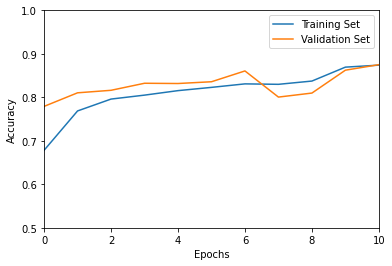

In [ ]:
training_accuracy = training_history.history['accuracy']
validation_accuracy = training_history.history['val_accuracy']

plt.figure()
plt.plot(training_accuracy, label = 'Training Set')
plt.plot(validation_accuracy, label = 'Validation Set')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.xlim([0,10])
plt.ylim([0.5,1])
plt.legend()
plt.show()

### Évaluation

In [ ]:
model.evaluate(testing_set)

159/159 [==============================] - 8s 51ms/step - loss: 0.3378 - accuracy: 0.8719


[0.33783265948295593, 0.8718553185462952]

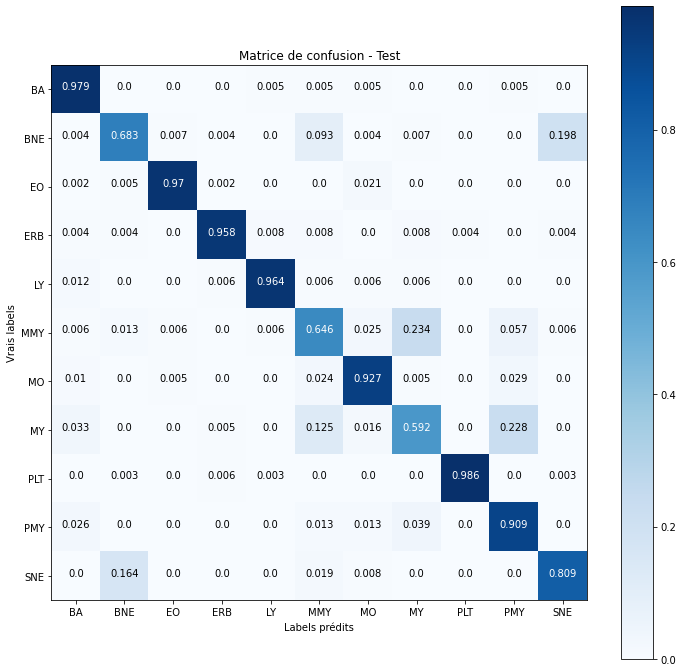

Classification Report - Test


,precision,recall,f1-score,support
BA,0.920398,0.978836,0.948718,189
BNE,0.788793,0.682836,0.732,268
EO,0.990544,0.969907,0.980117,432
ERB,0.974249,0.957806,0.965957,237
LY,0.97006,0.964286,0.967164,168
MMY,0.618182,0.64557,0.631579,158
MO,0.896714,0.927184,0.911695,206
MY,0.703226,0.592391,0.643068,184
PLT,0.997214,0.986226,0.99169,363
PMY,0.546875,0.909091,0.682927,77


In [ ]:
y_pred, df_report = print_classification_report(testing_set, label_map, title = "Test")

Pas d'effet significatif constaté.

In [ ]:
df_results = pd.DataFrame(data = {"label":testing_set.classes,
                                  "label_pred":y_pred, 
                                  "img_path":df_test["img_path"]})

df_results["well_classified"] = np.where(df_results["label"] == df_results["label_pred"], True, False)

### Grad-CAM

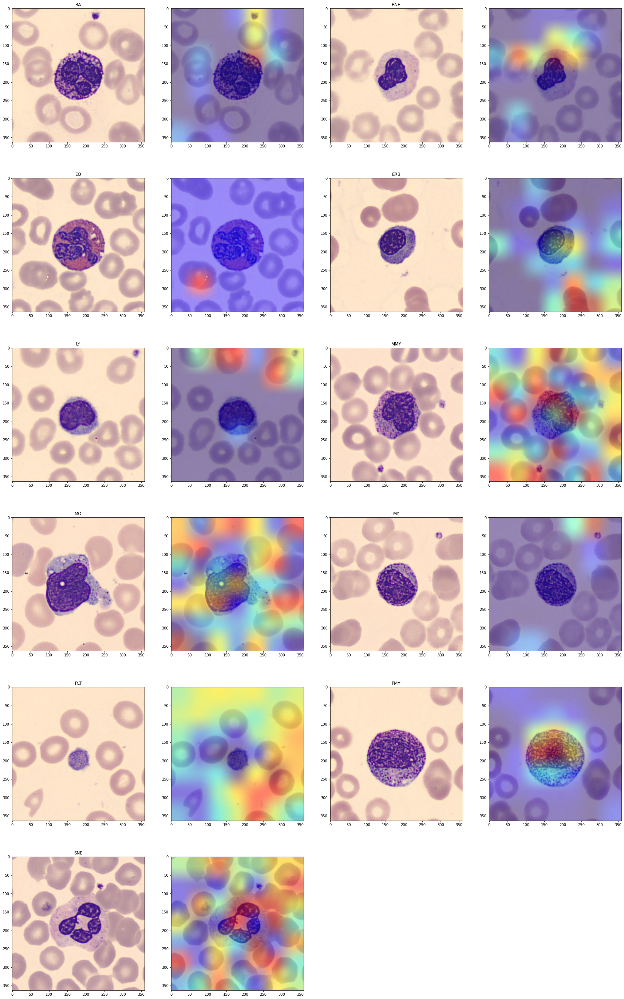

In [ ]:
fig = plt.figure(figsize = (30, 20))
i = 0

for cell_class in range(n_classes):
  df_temp = df_results[(df_results["label"] == cell_class) & (df_results["well_classified"] == True)]
  id = np.random.choice(df_temp.index, size = 1, replace = False)
  img_path = df_temp.loc[id[0],"img_path"]
 
  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, 
                                          class_index = None, alpha = 0.8, plot = False)

  fig.add_subplot(4,6,i+1)
  plt.imshow(plt.imread(img_path))
  plt.title(list(label_map.keys())[cell_class], fontsize = 30)
  plt.grid(None)
  plt.axis('off')

  fig.add_subplot(4,6,i+2)
  plt.imshow(superimposed_img)
  plt.grid(None)
  plt.axis('off')

  i += 2

plt.savefig("/content/drive/MyDrive/Leukopy/EffNetB0_Final/B0_structure1_batch16_gradcam")

Il semblerait que **réduire la taille des batches ait dégradé la capacité du modèle à identifier des structures pertinentes sur les images** : les résultats de Grad-CAM sont extrêmement mauvais.

Malgré cela, **les performances métriques restent comparables** (légèrement inférieures) à celles obtenues pour 32 images par batch.

## batch_size = 64

### Data

In [26]:
batch_size = 64
img_height  = 224
img_width = 224

# Augmentation seulement sur le jeu d'entraînement. On ne normalise pas, EfficientNet le fait lui-même.
train_generator = ImageDataGenerator(rotation_range = 90,
                                     horizontal_flip = True, 
                                     vertical_flip = True)
valid_generator = ImageDataGenerator()
test_generator = ImageDataGenerator()

# Batchs, redimensionnement, chargement des images
training_set = train_generator.flow_from_dataframe(df_train, 
                                                   directory = None, # utilise x_col
                                                   x_col = 'img_path', 
                                                   y_col = 'label',
                                                   target_size = (img_height, img_width), 
                                                   color_mode = 'rgb',
                                                   classes = None,   # utilise y_col
                                                   class_mode = 'categorical', 
                                                   batch_size = batch_size, 
                                                   shuffle = True)

validation_set = valid_generator.flow_from_dataframe(df_valid, 
                                                     directory = None, # utilise x_col
                                                     x_col = 'img_path', 
                                                     y_col = 'label',
                                                     target_size = (img_height, img_width), 
                                                     color_mode = 'rgb',
                                                     classes = None,   # utilise y_col
                                                     class_mode = 'categorical', 
                                                     batch_size = batch_size, 
                                                     shuffle = True)

testing_set = test_generator.flow_from_dataframe(df_test, 
                                                 directory = None, # utilise x_col
                                                 x_col = 'img_path', 
                                                 y_col = 'label',
                                                 target_size = (img_height, img_width),
                                                 color_mode = 'rgb',
                                                 classes = None,   # utilise y_col
                                                 class_mode = 'categorical', 
                                                 batch_size = batch_size, 
                                                 shuffle = False)

# Labels/Index connection :
label_map = training_set.class_indices
print('Train :', training_set.class_indices)
print('Valid :', validation_set.class_indices)
print('Test  :', testing_set.class_indices)

Found 12677 validated image filenames belonging to 11 classes.
Found 1730 validated image filenames belonging to 11 classes.
Found 2544 validated image filenames belonging to 11 classes.
Train : {'BA': 0, 'BNE': 1, 'EO': 2, 'ERB': 3, 'LY': 4, 'MMY': 5, 'MO': 6, 'MY': 7, 'PLT': 8, 'PMY': 9, 'SNE': 10}
Valid : {'BA': 0, 'BNE': 1, 'EO': 2, 'ERB': 3, 'LY': 4, 'MMY': 5, 'MO': 6, 'MY': 7, 'PLT': 8, 'PMY': 9, 'SNE': 10}
Test  : {'BA': 0, 'BNE': 1, 'EO': 2, 'ERB': 3, 'LY': 4, 'MMY': 5, 'MO': 6, 'MY': 7, 'PLT': 8, 'PMY': 9, 'SNE': 10}


### Modèle et entraînement

In [27]:
# Model (Functional API)
inputs = layers.Input(shape = (img_height,img_width,3))
base_model = EfficientNetB0(include_top = False,
                            weights = 'imagenet',
                            input_tensor = inputs,
                            input_shape = (img_height,img_width,3),
                            pooling = 'avg')

base_model.training = False     # Freeze EfficientNetB0 layers
base_output = base_model.output # Cette écriture permet d'avoir les couches de "base_model" au même niveau que les couches suivantes (voir model.summary())=> Grad-CAM peut fonctionner

x = layers.Dense(units = 1280, activation = 'relu', name = 'dense_1')(base_output)
x = layers.Dense(units = 640, activation = 'relu', name = 'dense_2')(x)
outputs = layers.Dense(units = n_classes, activation = 'softmax', name = 'final_softmax')(x)
model = tf.keras.Model(inputs, outputs)

base_model.trainable = False

# Compile
optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-3)
model.compile(optimizer = optimizer, 
              loss = "categorical_crossentropy",
              metrics = ["accuracy"])

In [29]:
## Compute weights :
class_weights = compute_weights(testing_set)

## Callbacks :
TON = TerminateOnNaN()

control_lr = ReduceLROnPlateau(monitor = 'val_loss', factor = 0.1, patience = 3, verbose = 1, mode = 'min', min_lr = 1e-6)
  
early_stopping = EarlyStopping(monitor = "val_loss", patience = 4, mode = 'min', restore_best_weights = True)

callbacks_list = [TON, control_lr, early_stopping]

## Training :
epochs = 30
training_history = model.fit(x = training_set, 
                             epochs = epochs,
                             callbacks = callbacks_list,
                             validation_data = validation_set, 
                             class_weight = class_weights)

Epoch 1/30
199/199 [==============================] - 152s 740ms/step - loss: 5.5666 - accuracy: 0.6565 - val_loss: 0.6776 - val_accuracy: 0.7503
Epoch 2/30
199/199 [==============================] - 146s 735ms/step - loss: 3.5563 - accuracy: 0.7775 - val_loss: 0.5301 - val_accuracy: 0.7983
Epoch 3/30
199/199 [==============================] - 146s 735ms/step - loss: 3.2050 - accuracy: 0.8012 - val_loss: 0.4467 - val_accuracy: 0.8335
Epoch 4/30
199/199 [==============================] - 146s 732ms/step - loss: 3.1454 - accuracy: 0.8041 - val_loss: 0.4885 - val_accuracy: 0.8098
Epoch 5/30
199/199 [==============================] - 146s 733ms/step - loss: 2.8552 - accuracy: 0.8224 - val_loss: 0.3846 - val_accuracy: 0.8538
Epoch 6/30
199/199 [==============================] - 146s 733ms/step - loss: 2.7927 - accuracy: 0.8272 - val_loss: 0.3866 - val_accuracy: 0.8601
Epoch 7/30
199/199 [==============================] - 146s 733ms/step - loss: 2.6575 - accuracy: 0.8352 - val_loss: 0.4300 -

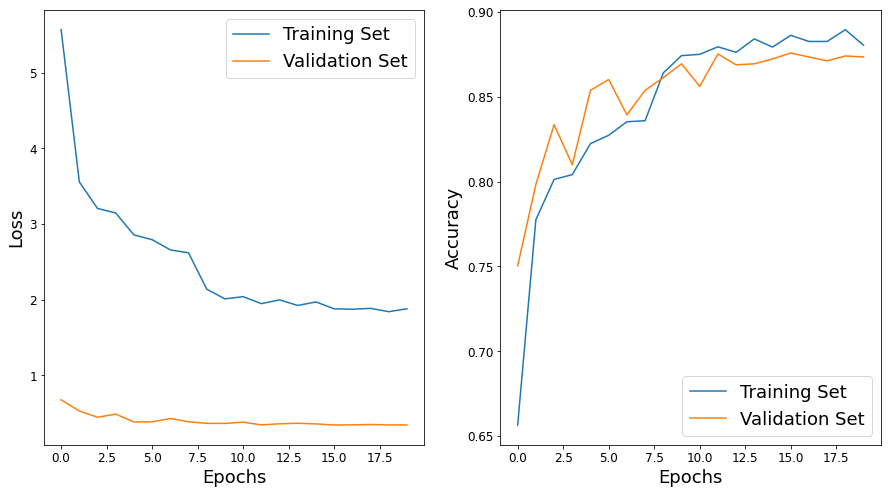

In [30]:
fig = plt.figure(figsize = (15,8))

fig.add_subplot(1,2,1)
plt.plot(training_history.history["loss"], label = 'Training Set')
plt.plot(training_history.history["val_loss"], label = 'Validation Set')
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.xlabel('Epochs', fontsize = 18)
plt.ylabel('Loss', fontsize = 18)
plt.legend(fontsize = 18)

fig.add_subplot(1,2,2)
plt.plot(training_history.history["accuracy"], label = 'Training Set')
plt.plot(training_history.history["val_accuracy"], label = 'Validation Set')
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.xlabel('Epochs', fontsize = 18)
plt.ylabel('Accuracy', fontsize = 18)
plt.legend(fontsize = 18)

### Évaluation

In [31]:
model.evaluate(testing_set)

40/40 [==============================] - 7s 180ms/step - loss: 0.3333 - accuracy: 0.8730


[0.3332556188106537, 0.8730345964431763]

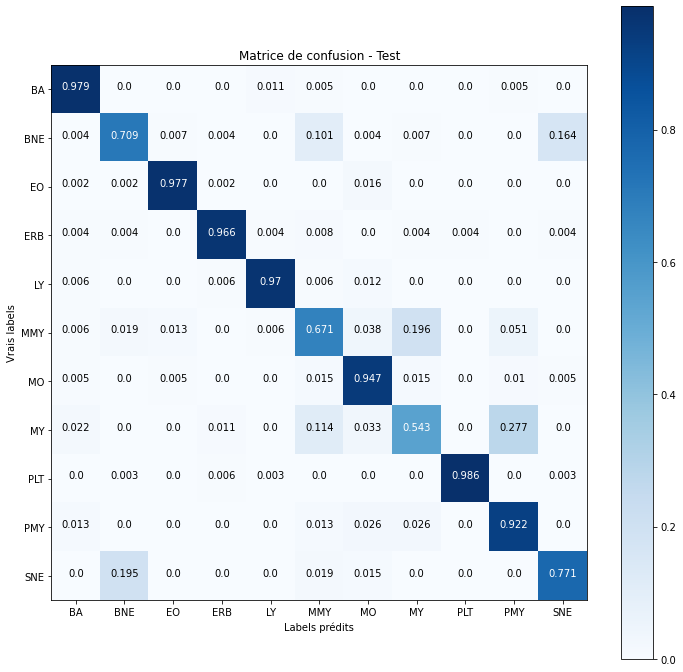

Classification Report - Test


,precision,recall,f1-score,support
BA,0.943878,0.978836,0.961039,189
BNE,0.769231,0.708955,0.737864,268
EO,0.98829,0.976852,0.982538,432
ERB,0.970339,0.966245,0.968288,237
LY,0.970238,0.970238,0.970238,168
MMY,0.634731,0.670886,0.652308,158
MO,0.874439,0.946602,0.909091,206
MY,0.719424,0.543478,0.619195,184
PLT,0.997214,0.986226,0.99169,363
PMY,0.533835,0.922078,0.67619,77


In [32]:
y_pred, df_report = print_classification_report(testing_set, label_map, title = "Test")

In [33]:
df_results = pd.DataFrame(data = {"label":testing_set.classes,
                                  "label_pred":y_pred, 
                                  "img_path":df_test["img_path"]})

df_results["well_classified"] = np.where(df_results["label"] == df_results["label_pred"], True, False)

### Grad-CAM

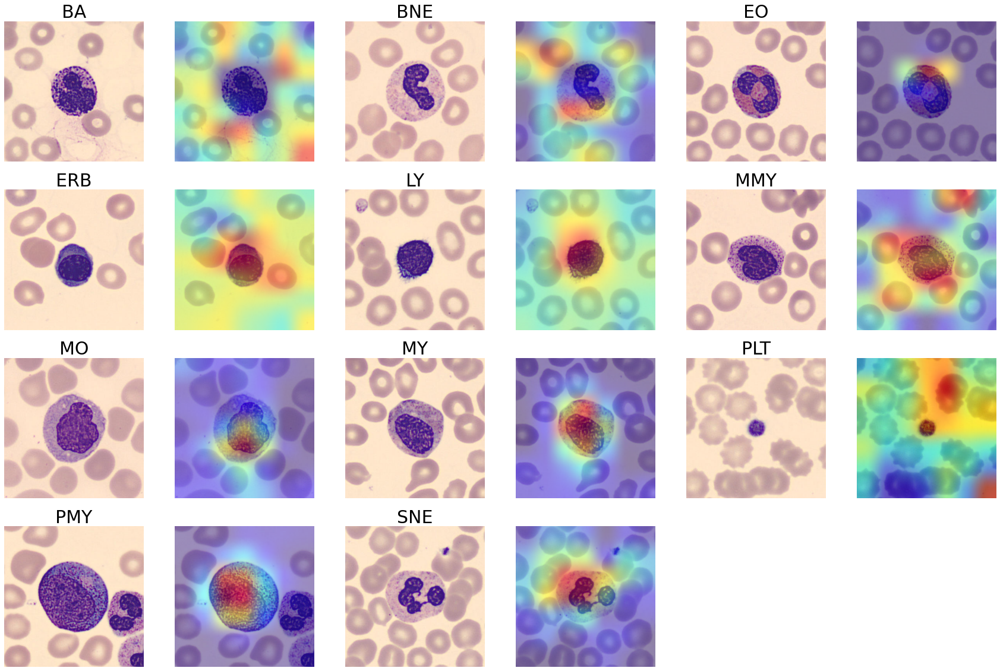

In [35]:
fig = plt.figure(figsize = (30, 20))
i = 0

for cell_class in range(n_classes):
  df_temp = df_results[(df_results["label"] == cell_class) & (df_results["well_classified"] == True)]
  id = np.random.choice(df_temp.index, size = 1, replace = False)
  img_path = df_temp.loc[id[0],"img_path"]
 
  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, 
                                          class_index = None, alpha = 0.8, plot = False)

  fig.add_subplot(4,6,i+1)
  plt.imshow(plt.imread(img_path))
  plt.title(list(label_map.keys())[cell_class], fontsize = 30)
  plt.grid(None)
  plt.axis('off')

  fig.add_subplot(4,6,i+2)
  plt.imshow(superimposed_img)
  plt.grid(None)
  plt.axis('off')

  i += 2

plt.savefig("/content/drive/MyDrive/Leukopy/EffNetB0_Final/B0_structure1_batch64_gradcam")

## Conclusion sur l'effet de la taille des batches

La taille des batchs ne semble pas avoir d'effet notable sur les performances du modèle.